<a href="https://colab.research.google.com/github/JohnnyUrosevic/Machine-Learning-Shenanigans/blob/master/Hotel_Reviews.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import files
files.upload()

Saving 7282_1.csv to 7282_1.csv


{'7282_1.csv': b'address,categories,city,country,latitude,longitude,name,postalCode,province,reviews.date,reviews.dateAdded,reviews.doRecommend,reviews.id,reviews.rating,reviews.text,reviews.title,reviews.userCity,reviews.username,reviews.userProvince\r\nRiviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2013-09-22T00:00:00Z,2016-10-24T00:00:25Z,,,4,Pleasant 10 min walk along the sea front to the Water Bus. restaurants etc. Hotel was comfortable breakfast was good - quite a variety. Room aircon didn\'t work very well. Take mosquito repelant!,Good location away from the crouds,,Russ (kent),\r\nRiviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2015-04-03T00:00:00Z,2016-10-24T00:00:25Z,,,5,Really lovely hotel. Stayed on the very top floor and were surprised by a Jacuzzi bath we didn\'t know we were getting! Staff were friendly and helpful and the included breakfast was great! Great location and great value for 

In [5]:
import numpy
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from keras.layers import Dropout
from keras.layers.embeddings import Embedding
from keras.utils import to_categorical

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow import keras

import string

def lower_helper(string):
    return str(string).lower()

def scale_ratings(rating):
    if rating > 5:
        return rating // 2
    
    return rating

#Parameters
embedding_size = 32
max_words = 5000
max_review_length = 500

data = pd.read_csv('7282_1.csv')
data = data[['reviews.text', 'reviews.rating']].dropna()
reviews = data['reviews.text'].apply(lower_helper)

values = data['reviews.rating'].apply(scale_ratings)

print(reviews)


0        pleasant 10 min walk along the sea front to th...
1        really lovely hotel. stayed on the very top fl...
2        ett mycket bra hotell. det som drog ner betyge...
3        we stayed here for four nights in october. the...
4        we stayed here for four nights in october. the...
5        we loved staying on the island of lido! you ne...
6        lovely view out onto the lagoon. excellent vie...
7        ottimo soggiorno e ottima sistemazione nei gio...
8        gnstiger ausgangspunkt fr venedig besuche. ruh...
9        lidoen er perfekt til et par dages ro og afsla...
10       accueil chaleureux, en franais changement du l...
11       it was ok hotel is nice from in and out but ro...
12       klasse frhstck, freundliches und aufmerksames ...
13       bardzo sympatyczna obsuga, klimat hotelu. wiet...
14       bra o lugnt lge. stor terrass. nra till den hr...
15       the hotel staff was very friendly and helpful....
16       nice hotel , with very friendly staff and help.

In [6]:
text = reviews[0]


for review in reviews[1:]:
    text += " " 
    text += str(review)

print(text)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [7]:
import string


# split into tokens by white space
tokens = text.split()
# remove punctuation from each token
table = str.maketrans('', '', string.punctuation)
tokens = [w.translate(table) for w in tokens]
# remove remaining tokens that are not alphabetic
tokens = [word for word in tokens if word.isalpha()]
# filter out short tokens
tokens = [word for word in tokens if len(word) > 1]

import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
tokens = [w for w in tokens if not w in stop_words]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [8]:
from collections import Counter
vocab = Counter()

vocab.update(tokens)

print(len(vocab))
print(vocab.most_common(25))

vocab = vocab.most_common(max_words)
vocab = [x[0] for x in vocab]
print(vocab)

36439
[('room', 19944), ('hotel', 17715), ('stay', 10703), ('staff', 9907), ('clean', 9464), ('great', 9460), ('breakfast', 8206), ('nice', 8015), ('good', 7128), ('would', 5792), ('rooms', 5674), ('friendly', 5408), ('comfortable', 4732), ('stayed', 4696), ('one', 4629), ('night', 4512), ('place', 4392), ('location', 4125), ('bed', 3733), ('desk', 3680), ('us', 3668), ('area', 3649), ('pool', 3388), ('time', 3369), ('front', 3327)]
['room', 'hotel', 'stay', 'staff', 'clean', 'great', 'breakfast', 'nice', 'good', 'would', 'rooms', 'friendly', 'comfortable', 'stayed', 'one', 'night', 'place', 'location', 'bed', 'desk', 'us', 'area', 'pool', 'time', 'front', 'like', 'helpful', 'service', 'get', 'well', 'could', 'didnt', 'back', 'close', 'also', 'price', 'day', 'really', 'free', 'bathroom', 'even', 'little', 'everything', 'beds', 'check', 'next', 'food', 'parking', 'small', 'first', 'two', 'go', 'got', 'door', 'old', 'hot', 'excellent', 'right', 'quiet', 'best', 'floor', 'made', 'family',

In [9]:
def convert_to_ints(data):
    new_list = []
    words = str(data).split(' ')
    for word in words:
        if (word in vocab):
            new_list.append(vocab.index(word) + 1)
        else:
            new_list.append(0)
    return new_list

bag = reviews.apply(convert_to_ints)

print(bag)

0        [134, 0, 738, 102, 500, 0, 1267, 25, 0, 0, 85,...
1        [38, 233, 0, 14, 0, 0, 0, 284, 61, 0, 0, 450, ...
2        [3095, 4401, 2149, 0, 1542, 2274, 0, 0, 0, 126...
3        [0, 14, 0, 0, 524, 90, 0, 0, 0, 2, 4, 0, 0, 12...
4        [0, 14, 0, 0, 524, 90, 0, 0, 0, 2, 4, 0, 0, 12...
5        [0, 123, 94, 0, 0, 1611, 0, 0, 0, 87, 0, 178, ...
6         [233, 86, 0, 1746, 0, 0, 57, 0, 4, 0, 471, 0, 0]
7        [4036, 4404, 0, 3879, 0, 0, 0, 0, 1330, 0, 362...
8        [0, 0, 1075, 0, 0, 0, 2533, 2238, 2112, 0, 0, ...
9        [0, 2582, 4617, 1612, 366, 1128, 0, 0, 1249, 0...
10       [2810, 0, 346, 0, 0, 959, 0, 103, 1210, 3750, ...
11       [0, 0, 115, 2, 0, 8, 0, 0, 0, 0, 0, 1, 0, 49, ...
12       [0, 0, 0, 541, 0, 0, 4405, 0, 3751, 0, 1117, 0...
13        [0, 0, 0, 0, 0, 0, 0, 0, 2276, 0, 0, 0, 0, 0, 0]
14       [2149, 0, 0, 0, 0, 0, 0, 1012, 1886, 0, 0, 346...
15       [0, 2, 4, 0, 0, 12, 0, 0, 0, 1, 0, 5, 0, 0, 0,...
16       [8, 2, 0, 0, 0, 12, 4, 0, 27, 0, 6, 371, 0, 7,.

In [10]:
import sklearn

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(bag, values, test_size=.2)
print(y_train)
y_train = to_categorical(y_train, num_classes=6)
y_test = to_categorical(y_test)
X_train = sequence.pad_sequences(X_train, maxlen=max_review_length)
X_test = sequence.pad_sequences(X_test, maxlen=max_review_length)

print(X_train)

11322    3.0
20524    0.0
25739    4.0
22641    4.0
32228    4.0
21758    5.0
25715    2.0
24190    5.0
4012     0.0
1364     5.0
28661    3.0
16197    3.0
7323     3.0
19578    0.0
30054    5.0
30531    2.0
5311     5.0
13725    2.0
33430    2.0
25047    4.0
27720    2.0
10960    3.0
9466     5.0
11258    3.0
21631    5.0
2526     4.0
11244    2.0
15440    3.0
16573    4.0
34234    4.0
        ... 
15961    1.0
31311    5.0
14445    0.0
15885    5.0
28364    4.0
14864    1.0
5205     5.0
2263     4.0
18397    1.0
3066     5.0
35842    5.0
813      4.0
1212     4.0
32882    4.0
21262    4.0
34259    5.0
14999    1.0
11726    4.0
20036    4.0
22406    3.0
10642    3.0
16456    2.0
22221    4.4
23570    4.0
33675    5.0
388      5.0
20230    4.0
21605    5.0
29602    5.0
4693     3.0
Name: reviews.rating, Length: 28022, dtype: float64
[[   0    0    0 ...  590    0    0]
 [   0    0    0 ...    0    0  278]
 [   0    0    0 ... 1052    0  823]
 ...
 [   0    0    0 ...  292    0    0]
 [

In [11]:
model = Sequential()
model.add(Embedding(max_words + 1, embedding_size, input_length=max_review_length))
model.add(Dropout(0.2))
model.add(LSTM(100))
model.add(Dropout(0.2))
model.add(Dense(6, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())
model.fit(X_train, y_train, epochs=3, batch_size=64)
# Final evaluation of the model
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 500, 32)           160032    
_________________________________________________________________
dropout_1 (Dropout)          (None, 500, 32)           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               53200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 606       
Total params: 213,838
Trainable params: 213,838
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/3
28022/28022 [==============================] - 308s 11ms/step - loss: 1.3875 - acc: 0.3870
Epoch 2/3
28022/28022 [=======

In [12]:
#model checking positive or negative
positivity = data['reviews.rating'].apply(lambda x: 0 if x < 3 else 1)
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(bag, positivity, test_size=.2)
#print(y_train)
X_train = sequence.pad_sequences(X_train, maxlen=max_review_length)
X_test = sequence.pad_sequences(X_test, maxlen=max_review_length)

#print(positivity)
model2 = Sequential()
model2.add(Embedding(max_words + 1, embedding_size, input_length=max_review_length))
model2.add(Dropout(0.2))
model2.add(LSTM(100))
model2.add(Dropout(0.2))
model2.add(Dense(1, activation='sigmoid'))
model2.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model2.summary())
model2.fit(X_train, y_train, epochs=3, batch_size=64)
# Final evaluation of the model
scores = model2.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

5624     1
11838    1
26301    1
14542    1
28694    1
18511    1
18161    1
20463    1
34885    1
8140     0
10661    1
6161     1
7299     1
11575    0
34382    0
14654    1
21642    1
23560    1
7382     1
33403    0
9689     1
24882    1
13023    1
20798    1
1728     1
9130     0
30705    1
33016    1
31283    0
11098    0
        ..
6454     1
22636    0
4928     1
1850     1
18681    1
32155    1
16589    1
21639    0
12522    0
10981    1
9074     1
33163    1
25786    1
23535    1
23829    1
27501    0
23044    1
31186    1
33625    0
4575     0
17815    1
5726     1
33822    1
9344     1
11264    1
25085    1
31611    1
20041    0
32473    1
32039    1
Name: reviews.rating, Length: 28022, dtype: int64
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 500, 32)           160032    
_________________________________________________________________
dropout_3 (Drop

[[1.]
 [1.]
 [1.]
 ...
 [1.]
 [1.]
 [1.]]


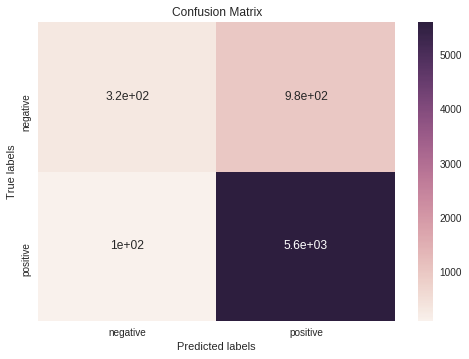

In [16]:
from sklearn.metrics import confusion_matrix

predictions = np.around(model2.predict(X_test))

#print(predictions)

cm = confusion_matrix(y_test, predictions)

import seaborn as sns
import matplotlib.pyplot as plt     

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax);

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['negative', 'positive']); ax.yaxis.set_ticklabels(['positive', 'negative']);

In [19]:
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(bag, values / 5, test_size=.2)
print(y_train)
X_train = sequence.pad_sequences(X_train, maxlen=max_review_length)
X_test = sequence.pad_sequences(X_test, maxlen=max_review_length)

#print(positivity)
model3 = Sequential()
model3.add(Embedding(max_words + 1, embedding_size, input_length=max_review_length))
model3.add(Dropout(0.2))
model3.add(LSTM(100))
model3.add(Dropout(0.2))
model3.add(Dense(1, activation='sigmoid'))
model3.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
print(model3.summary())
model3.fit(X_train, y_train, epochs=3, batch_size=64)
# Final evaluation of the model
scores = model3.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

29464    1.0
34005    0.8
17150    0.8
4796     0.8
12393    0.2
15795    1.0
13458    0.2
18751    1.0
15249    0.4
30126    0.8
13802    1.0
15990    0.6
31541    0.2
34430    1.0
14703    0.2
22508    0.6
23215    0.8
6355     1.0
12712    0.8
11381    1.0
9976     0.6
10739    0.8
21426    0.6
21955    0.8
15768    0.6
10169    1.0
31281    0.8
32763    1.0
23813    0.8
32521    0.4
        ... 
12827    0.4
14394    0.8
27501    0.2
17247    0.6
3068     0.8
28394    0.8
10247    0.2
30056    1.0
24515    0.8
29978    0.4
2136     1.0
17739    1.0
3299     0.6
32202    0.4
23592    1.0
992      0.8
34750    0.0
33016    1.0
20414    1.0
20279    0.6
12844    0.6
24728    1.0
25715    0.4
29078    1.0
29894    0.4
31967    0.8
1333     1.0
33532    0.8
19164    1.0
9779     1.0
Name: reviews.rating, Length: 28022, dtype: float64
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)